# Multi-organ c2l analysis

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os,sys
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import scipy.sparse
import anndata

In [3]:
figdir = "/home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/spatial_mapping_EDA/"
if os.path.exists(figdir):
    sc.settings.figdir = figdir
else:
    os.mkdir(figdir)
    sc.settings.figdir = figdir
    

In [4]:
# ## Directory to save intermediate outputs
# writedir = "/nfs/team205/ed6/data/Fetal_immune/PAGA_FA_outs/"
# if not os.path.exists(writedir):
#     os.mkdir(writedir)    

In [5]:
import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging

In [6]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

Activate the anndata2ri conversion between SingleCellExperiment and AnnData

In [7]:
anndata2ri.activate()

In [8]:
%load_ext rpy2.ipython

In [9]:
%%R
library(tidyverse)

### Plotting utils

In [10]:
def _spatial_plot_lib(adata_vis, lib, color_by=None, **kwargs):
    with matplotlib.rc_context({"axes.facecolor": "black"}):
        s_ind = adata_vis.obs['sample'] == lib
        s_keys = list(adata_vis.uns['spatial'].keys())
        s_spatial = np.array(s_keys)[[lib in i for i in s_keys]][0]
        adata_small = adata_vis[s_ind, :].copy()
        sc.pl.spatial(adata_small, library_id=s_spatial,
                                **kwargs)
        
def _plot_sorted_violin(merged_adata_bcells, groupby, y_value, return_list=False):
    n_cells_anno = merged_adata_bcells.obs[[groupby,y_value]].value_counts(groupby)
    keep_anno = n_cells_anno.index[n_cells_anno > 30]

    mean_sim = merged_adata_bcells.obs[[groupby,y_value]].groupby(groupby).mean()
    anno_order = mean_sim.loc[keep_anno].sort_values(y_value, ascending=False).index.tolist()

    merged_adata_bcells.var_names_make_unique()
    sc.pl.violin(merged_adata_bcells[merged_adata_bcells.obs[groupby].isin(keep_anno)], 
                                     y_value, groupby=groupby, rotation=90, 
                                     order=anno_order)
    if return_list:
        return(anno_order)
    

In [11]:
def select_slide(adata, s, s_col='sample'):
    r""" This function selects the data for one slide from the spatial anndata object.
    
    :param adata: Anndata object with multiple spatial experiments
    :param s: name of selected experiment
    :param s_col: column in adata.obs listing experiment name for each location
    """
    
    slide = adata[adata.obs[s_col].isin([s]), :].copy()
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}
    
    return slide

def plot_spatial_per_cell_type(adata, 
                                   cell_type='total_counts',
                                   samples=['WSSS_F_IMMsp9838712', 'WSSS_F_IMMsp9838717', 
                                             'WSSS_F_IMMsp9838710', 
                                             'WSSS_F_IMMsp9838715', 
                                            'WSSS_F_IMMsp9838711', 'WSSS_F_IMMsp9838716'],
                                  ncol=3, prefix=''):
        n_samples = len(samples)
        nrow = int(np.ceil(n_samples / ncol))
        fig, axs = plt.subplots(nrow, ncol, figsize=(18, 8))
        if nrow == 1:
            axs = axs.reshape((1, ncol))

        col_name = f'{prefix}{cell_type}'
        vmax = np.quantile(adata[adata.obs["sample"].isin(samples)].obs[col_name].values, 0.992)
        adata.obs[cell_type] = adata.obs[col_name].copy()

        from itertools import chain
        ind = list(chain(*[[(i, j) for i in range(nrow)] for j in range(ncol)]))

        for i, s in enumerate(samples):
            sp_data_s = select_slide(adata, s, s_col='sample')
            sc.pl.spatial(sp_data_s, cmap='magma',
                          color=cell_type, 
                          size=1.3, img_key='hires', alpha_img=1,
                          vmin=0, vmax=vmax, ax=axs[ind[i][0],ind[i][1]], show=False
                                                )
            axs[ind[i][0],ind[i][1]].title.set_text(cell_type+'\n'+s)

        fig.tight_layout(pad=0.5)

        return fig


In [710]:
select_slides = {
    'SP':['WSSS_F_IMMsp9838710', 'WSSS_F_IMMsp9838715'],
    "LI":['WSSS_F_IMMsp9838712', 'WSSS_F_IMMsp9838717'],
    "TH":['WSSS_F_IMMsp9838716', 'WSSS_F_IMMsp9838711'],
    "GU":['6330STDY9479159', '6330STDY9479160']
}

def _plot_slides_spatial(adata_vis_full, 
                         col_name, 
                         samples = sum(select_slides.values(), []), 
                         ncol=4, vmin=0):
    n_samples = len(samples)
    nrow = int(np.ceil(n_samples / ncol))
    fig, axs = plt.subplots(nrow, ncol, figsize=(18, 8))
    if nrow == 1:
        axs = axs.reshape((1, ncol))

    from itertools import chain
    ind = list(chain(*[[(i, j) for i in range(nrow)] for j in range(ncol)]))

    for i, s in enumerate(samples):
        vmax = np.quantile(adata_vis_full[adata_vis_full.obs["sample"].isin([s])].obs[col_name].values, 0.992)
        sns.set_context("notebook", font_scale=1.1)
        plt.rcParams["figure.figsize"] = [10,10]
        plt.rcParams['axes.titlesize'] = 32
        _spatial_plot_lib(adata_vis_full, color=[col_name], lib=s, ncols=1, size=1.3, vmin=vmin, vmax=vmax,
                          cmap="magma", frameon=False, title="",
                          ax=axs[ind[i][0],ind[i][1]], show=False
                         )
        plt.locator_params(axis='y', nbins=3)
        plt.rcParams['axes.titlesize'] = 20

    fig.tight_layout()
    return(fig)

In [435]:
org_colors = pd.read_csv('../../metadata/organ_colors.csv')
org_colors

,organ,color
0,YS,#0173b2
1,LI,#de8f05
2,BM,#029e73
3,TH,#d55e00
4,SP,#cc78bc
5,MLN,#ca9161
6,SK,#fbafe4
7,GU,#949494
8,KI,#ece133


### Read results

In [12]:
## Read annotation groupings
import json
with open('../../metadata/anno_groups.json', 'r') as json_file:
    anno_groups_dict = json.load(json_file)
anno_groups_dict_rev = {x:g for g,a in anno_groups_dict.items() for x in a}
anno_groups_dict_rev = {"_".join(k.split("/")):v for k,v in anno_groups_dict_rev.items()}

In [13]:
def read_c2l(c2l_outdir):
    adata_vis = sc.read_h5ad(c2l_outdir + "sp.h5ad")

    adata_vis.obs["Organ"] = adata_vis.obs["Organ"].str[0:2]

    ## Add total cell abundance
    adata_vis.obs['total_cell_abundance'] = adata_vis.uns['mod']['post_sample_means']['w_sf'].sum(1).flatten()

    # add 5% quantile, representing confident cell abundance, 'at least this amount is present', 
    # to adata.obs with nice names for plotting
    # adata_vis.obs[adata_vis.uns['mod']['factor_names']] = (adata_vis.obsm['q05_cell_abundance_w_sf'].T/adata_vis.obs["total_cell_abundance"]).T
    adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_abundance_w_sf'].copy()

    ## Make metadata table for libraries
    vis_sample_metadata = adata_vis.obs[["sample", 'Organ', "Age_PCW"]].drop_duplicates()
    vis_sample_metadata.index = vis_sample_metadata['sample'].copy()
    vis_sample_metadata = vis_sample_metadata.drop("sample", 1)

    ## Ref celltypes info
    celltypes_df = pd.DataFrame(adata_vis.uns['mod']['factor_names'], columns=['annotation'])
    celltypes_df['anno_group'] = [anno_groups_dict_rev[c] if c in anno_groups_dict_rev.keys() else "STROMAL" for c in celltypes_df.annotation]
    celltypes_df['stromal_organ'] = np.nan
    celltypes_df.loc[celltypes_df['anno_group'] == "STROMAL", "stromal_organ"] = [x[-1] for x in celltypes_df[celltypes_df['anno_group'] == "STROMAL"].annotation.str.split("_")]

    celltypes_df.index = celltypes_df['annotation'].copy()
    return(adata_vis, celltypes_df, vis_sample_metadata)

In [14]:
def read_nmf(c2l_outdir, n_fact, out_type='ct_fractions'):
    nmf_outdir = c2l_outdir + 'CoLocatedComb/' + os.listdir(c2l_outdir + 'CoLocatedComb/')[0]
    if len(os.listdir(c2l_outdir + 'CoLocatedComb/')) > 1:
        nmf_outdir = c2l_outdir + 'CoLocatedComb/' + os.listdir(c2l_outdir + 'CoLocatedComb/')[1]
    if out_type == 'ct_fractions':
        ct_frac_outdir = nmf_outdir + "/cell_type_fractions_mean/"
        fact_mat = [x for x in os.listdir(ct_frac_outdir) if "n_fact" + str(n_fact) in x][0]
        out = pd.read_csv(ct_frac_outdir + fact_mat, index_col=0)
    elif out_type == "location":
        loc_outdir = nmf_outdir + "/location_factors_mean/"
        fact_mat = [x for x in os.listdir(loc_outdir) if "n_fact" + str(n_fact) in x][0]
        out = pd.read_csv(loc_outdir + fact_mat, index_col=0)
    return(out)

In [15]:
## Find celltypes where the max abundance in each slide is below a defined threshold
# (to exclude from co-location analysis)
def get_undetected_cts(adata_vis, vis_sample_metadata, detection_thresh = 0.15):
    detected_ct_df = pd.DataFrame(index=adata_vis.obsm['q05_cell_abundance_w_sf'].columns.values)
    for s in adata_vis.obs['sample'].unique():
        slide_q05_abundance = adata_vis[adata_vis.obs['sample'] == s].obsm['q05_cell_abundance_w_sf']
        is_detected = pd.Series(np.quantile(slide_q05_abundance, 0.992, axis=0))
        is_detected.index = detected_ct_df.index
        is_detected[is_detected < detection_thresh] = 0
        is_detected.name = s
        detected_ct_df = pd.concat([detected_ct_df, is_detected], 1)

    detected_ct_df.index = [x[1] for x in detected_ct_df.index.str.split('q05cell_abundance_w_sf_')]
    detected_ct_df = detected_ct_df[adata_vis.obs['sample'].unique()]

    undetected_cts = detected_ct_df[detected_ct_df.sum(1)==0].index
    return(undetected_cts)

In [16]:
def get_colocation_from_nmf(adata_vis, vis_sample_metadata, c2l_outdir, n_factors, min_frac = 0.2, detection_thresh=0.15):
    ## Read celltype fractions 
    nmf_fractions = read_nmf(c2l_outdir, n_fact=n_factors)
    ## Exclude undetected cts
    exclude_cts = get_undetected_cts(adata_vis, vis_sample_metadata, detection_thresh=detection_thresh)
    nmf_fractions = nmf_fractions[~nmf_fractions.index.isin(exclude_cts)]
    ## Filter by minimum fraction associated to factor 
    nmf_fractions = nmf_fractions.mask(nmf_fractions < min_frac, other=0)
    coloc_df = nmf_fractions.mask(nmf_fractions > 0, other=1)
    coloc_df.columns = ['fact_'+str(i) for i in range(n_factors)]
    return(coloc_df)

In [17]:
def pick_n_factors(c2l_outdir, n_fact_range=range(10,20)):
    max_cors = []
    for n in n_fact_range:
        nmf_fractions = read_nmf(c2l_outdir, n_fact=n)
        fact_cors = np.corrcoef(nmf_fractions.T)
        np.fill_diagonal(fact_cors, 0)
        max_cor = fact_cors.max()
        max_cors.append(max_cor)
    return(n_fact_range[np.argmin(max_cors)])



In [24]:
multiorgan_c2l_outdir = '/nfs/team205/vk7/sanger_projects/collaborations/pan_fetal_immune_mapping/results/spatial_mapping_multiorgan_withGutNoDonor_tissueQCfilter_epochs50k_alphatest20/'

In [449]:
## Read full c2l output
adata_vis_full, celltypes_df_full, vis_sample_metadata_full = read_c2l(multiorgan_c2l_outdir)

In [608]:
## rename gut slides
adata_vis_full.obs.loc[adata_vis_full.obs['Organ'].isin(['FP', "FT"]), "Organ"] = 'GU'
vis_sample_metadata_full.loc[vis_sample_metadata_full['Organ'].isin(['FP', "FT"]), "Organ"] = 'GU'

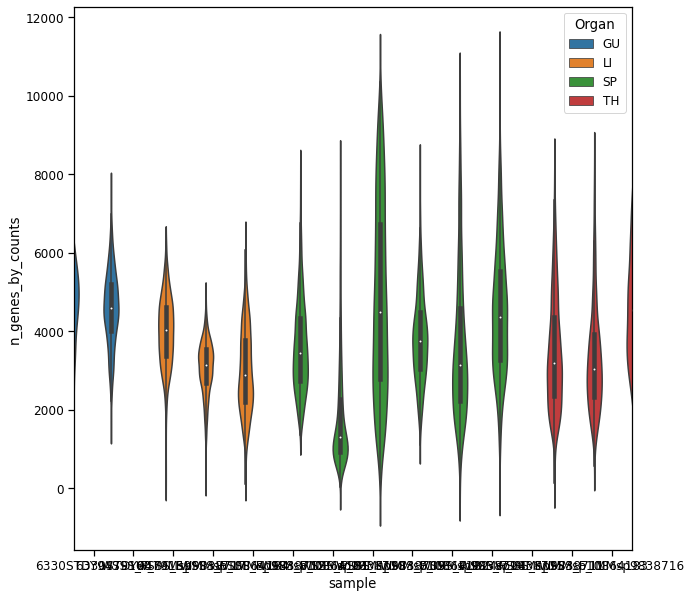

<AxesSubplot:xlabel='sample', ylabel='total_counts'>

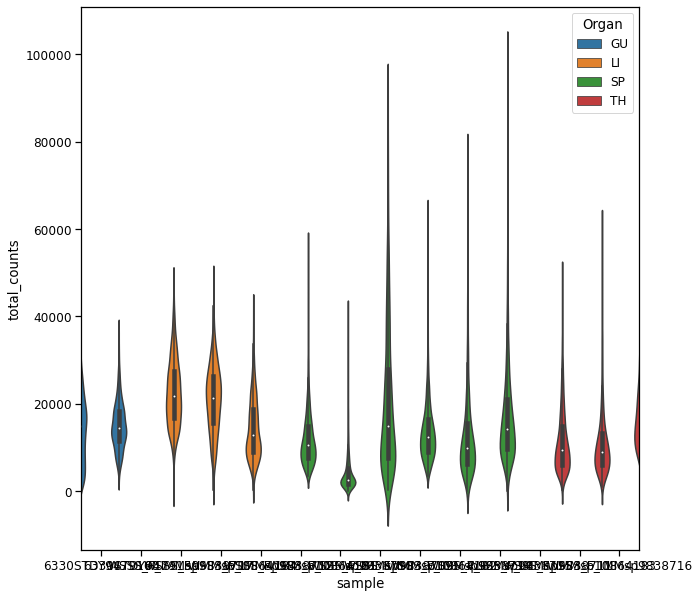

In [833]:
qc_df = adata_vis_full.obs[['n_genes_by_counts','total_counts', 'sample', "Organ"]]
qc_df = qc_df.sort_values("Organ")

sns.violinplot(data=qc_df, y='n_genes_by_counts', x='sample', hue='Organ', 
               order=qc_df['sample'].unique(), 
               width=1.5);
plt.show()
sns.violinplot(data=qc_df, y='total_counts', x='sample', hue='Organ', 
               order=qc_df['sample'].unique(), 
               width=1.5)

### Check that abundance after deconvolution correlates with abundance in single-cell data

In [451]:
## Filter maternal contaminants
data_dir = '/nfs/team205/ed6/data/Fetal_immune/'
timestamp = '20210429'
mat_barcodes = pd.read_csv("~/Pan_fetal_immune/metadata/souporcell_results/maternal_barcodes.csv", index_col=0)
mat_barcodes["x"] = pd.Series([x.split("-1")[0] for x in mat_barcodes['x']])
anno_obs = pd.read_csv(data_dir + "PAN.A01.v01.entire_data_normalised_log.20210429.full_obs.annotated.clean.csv", index_col=0)

## Abundance in sc data
sc_ct_counts = anno_obs[anno_obs.age >= 16][anno_obs[anno_obs.age >= 16].organ.isin(["TH", "LI", "SP", "GU"])].groupby(['organ','anno_lvl_2_final_clean']).count().unstack(fill_value=0).stack()
sc_ct_counts = sc_ct_counts.reset_index()[['organ','anno_lvl_2_final_clean','n_genes']]
sc_ct_counts.columns = ['organ','anno_lvl_2_final_clean','n_cells']

In [515]:
## Abundance in visium deconvolution
vis_ct_counts = adata_vis_full.obs[list(adata_vis_full.uns['mod']["factor_names"]) + ["Organ"]].groupby("Organ").sum()
vis_ct_counts = vis_ct_counts.reset_index().melt(id_vars=["Organ"], var_name="anno_lvl_2_final_clean", value_name="sum_cell_abundance")
vis_ct_counts.columns = ['organ'] + list(vis_ct_counts.columns[1:])

## Calculate relative abundance over total cell abundance per organ
org_total_abundance = adata_vis_full.obs[['Organ','total_cell_abundance']].groupby('Organ').sum('total_cell_abundance').reset_index()
org_total_abundance.columns=['organ', 'total_cell_abundance']
vis_ct_counts = pd.merge(vis_ct_counts, org_total_abundance, how='left')
vis_ct_counts['sum_cell_abundance'] = vis_ct_counts['sum_cell_abundance']/vis_ct_counts['total_cell_abundance']

all_counts = pd.merge(vis_ct_counts, sc_ct_counts)

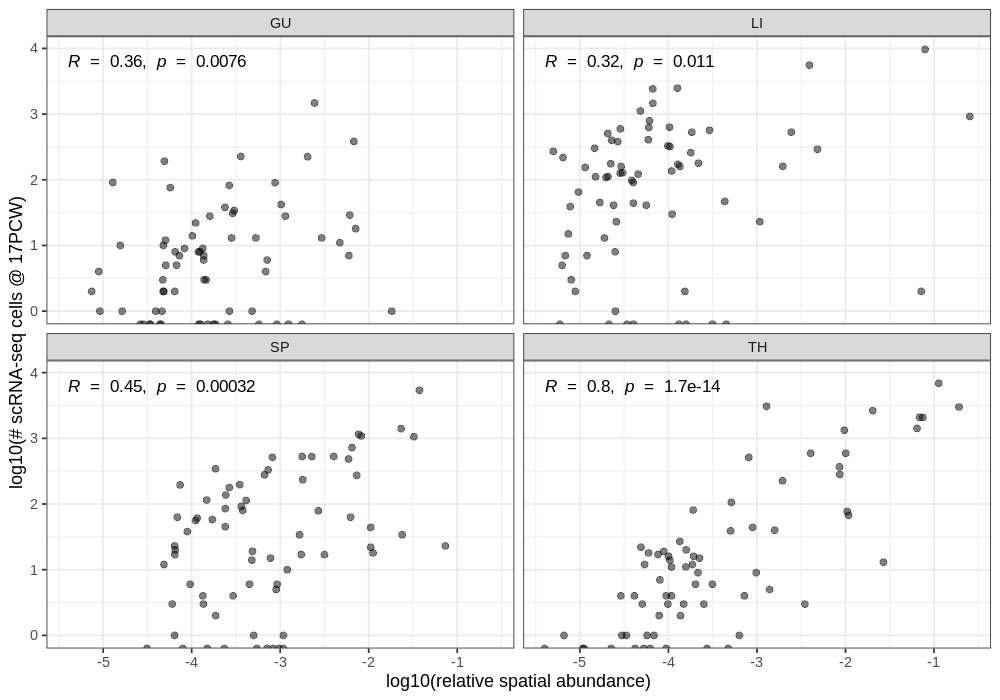

In [518]:
%%R -i all_counts -w 1000 -h 700 -i figdir
pl <- all_counts %>%
#     filter(mean_cell_abundance > 0.1) %>%
    ggplot(aes(log10(sum_cell_abundance), log10(n_cells))) +
    geom_point(size=3, alpha=0.5) +
    facet_wrap(organ~.) +
#     geom_smooth(method='lm') +
    ggpubr::stat_cor(size=6) +
    theme_bw(base_size = 18) +
    xlab("log10(relative spatial abundance)") + ylab("log10(# scRNA-seq cells @ 17PCW)") 
    
ggsave(paste0(figdir, 'cell_abundance_comparison.pdf'),pl, width=10, height=4)
pl    

### Correlation between scRNA-seq abundance and spatial abundance of progenitor cells

In [484]:
progenitor_groups = {
    'T_prog':["DN(early)_T","DN(Q)_T", "DN(P)_T"],
    'B_prog' :['PRE_PRO_B','PRO_B','LATE_PRO_B','LARGE_PRE_B','SMALL_PRE_B'],
    'MEM_prog' : ['MEMP', 'CYCLING_MEMP', 'MEP'],
    'MYE_prog' : ['CMP','DC_PROGENITOR','GMP','MOP','MYELOCYTE','PROMONOCYTE','PROMYELOCYTE']
    }

progenitor_groups_rev = {x:k for k,v in progenitor_groups.items() for x in v }

In [443]:
## Abundance in visium deconvolution
vis_prog_counts = adata_vis_full.obs[list(progenitor_groups_rev.keys()) + ["Organ", "sample"]].groupby(['sample']).sum()
vis_prog_counts = pd.concat([vis_prog_counts, vis_sample_metadata_full], 1)
vis_prog_counts = vis_prog_counts.reset_index().melt(id_vars=['sample', "Organ", "Age_PCW"], var_name="anno_lvl_2_final_clean", value_name="sum_cell_abundance")

vis_prog_counts.columns = ['sample','organ', 'age'] + list(vis_prog_counts.columns[3:])
vis_prog_counts['prog_group'] = [progenitor_groups_rev[x] for x in vis_prog_counts['anno_lvl_2_final_clean']]
vis_prog_counts.organ = ["GU" if x in ['FT', "FP"] else x for x in vis_prog_counts.organ]

In [459]:
vis_prog_counts = pd.merge(vis_prog_counts, sc_ct_counts[['n_cells', 'organ', 'anno_lvl_2_final_clean']], how="left")

`summarise()` has grouped output by 'prog_group', 'organ', 'age'. You can override using the `.groups` argument.


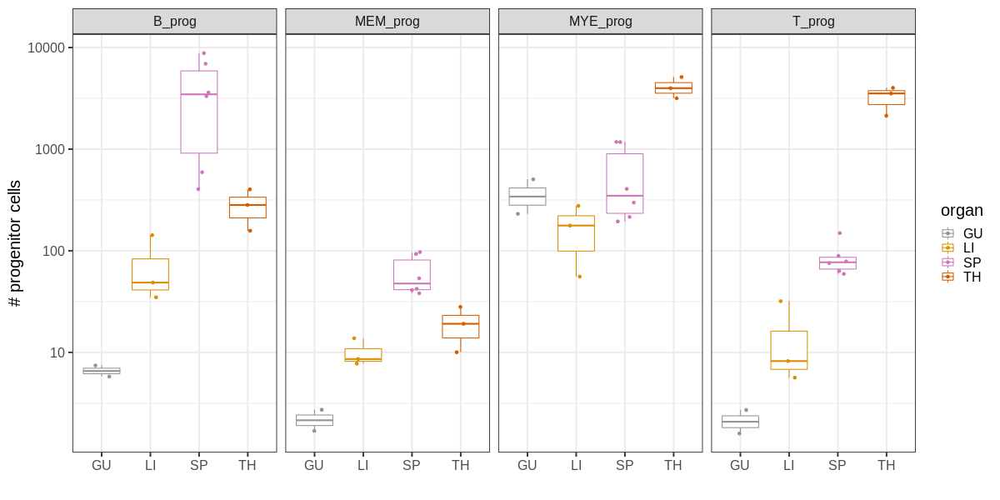

In [460]:
%%R -i vis_prog_counts -i org_colors -i figdir -w 1200 -h 600
org_palette <- setNames(org_colors$color, org_colors$organ)
vis_prog_counts %>%
    group_by(prog_group, organ, age, sample) %>%
    summarise(sum_cell_abundance = sum(sum_cell_abundance)) %>%
    ggplot(aes(organ, sum_cell_abundance, color=organ)) +
    geom_boxplot(outlier.alpha=0) + 
    geom_jitter(height=0, width=0.2) +
    scale_y_log10() +
    scale_color_manual(values=org_palette) +
    facet_grid(.~prog_group, scales='free') +
    theme_bw(base_size=20) +
    ylab("# progenitor cells") + xlab("") 

    

`summarise()` has grouped output by 'prog_group', 'organ', 'age'. You can override using the `.groups` argument.


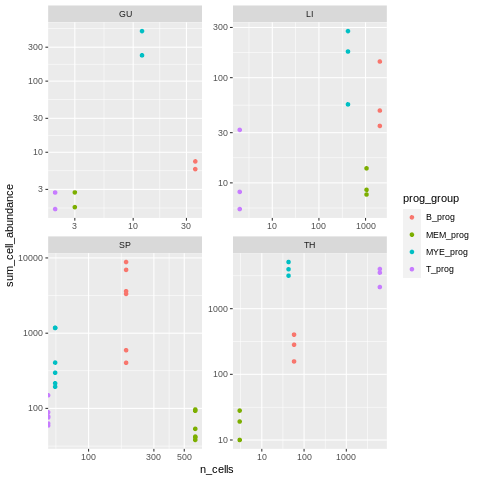

In [466]:
%%R
vis_prog_counts %>%
    group_by(prog_group, organ, age, sample) %>%
    summarise(sum_cell_abundance = sum(sum_cell_abundance), n_cells=sum(n_cells)) %>%
    ggplot(aes(n_cells, sum_cell_abundance, color=prog_group)) +
    geom_point() +
    scale_x_log10() +
    scale_y_log10() +
    facet_wrap(organ~., scales='free')

In [538]:
all_counts['prog_group'] = [progenitor_groups_rev[x] if x in progenitor_groups_rev.keys() else np.nan for x in all_counts['anno_lvl_2_final_clean']]
all_counts['prog_group'] = all_counts.prog_group.astype("str")

In [561]:
%%R -i all_counts -w 1000 -h 700 -i figdir
lineage_names <- list(
  'MEM_prog'="Megakaryocyte/Erythroid\nprogenitors",
  'MYE_prog'="Myeloid\nprogenitors",
  'B_prog'="B cells\nprogenitors",
  'T_prog'="T cells\nprogenitors"
)


pl2 <- all_counts %>%
    ggplot(aes(sum_cell_abundance, n_cells+1)) +
    scale_y_log10() + scale_x_log10() +
    geom_point(size=2, alpha=0.5) +
    geom_point(data= . %>% filter(prog_group!="nan"), aes(fill=prog_group), size=3, shape=21) +
    facet_wrap(organ~., scale='free') +
#     geom_smooth(method='lm') +
    scale_fill_brewer(palette="Accent",
                      labels=lineage_names,
                      name='Progenitor\nlineage') +
    guides(fill=guide_legend(keyheight=3, override.aes=list(size=5))) +
    ggpubr::stat_cor(size=6) +
    theme_bw(base_size = 18) +
    xlab("log10(relative spatial abundance)") + ylab("log10(# scRNA-seq cells @ 17PCW)") 
    
ggsave(paste0(figdir, 'cell_abundance_comparison_wProgenitors.pdf'),pl2, width=11, height=9)


### Are stromal cells more frequently mapped to the right organ?

In [553]:
stromal_cts = celltypes_df_full.annotation[(celltypes_df_full.anno_group=="STROMAL")]

In [554]:
## Add notation for thymic specific cells
missing_org_cts = ~((stromal_cts.str.endswith("_TH")) | (stromal_cts.str.endswith("_LI")) | (stromal_cts.str.endswith("_GU")) | (stromal_cts.str.endswith("_SP")))
adata_vis_full.obs.columns = [x + "_TH" if x in stromal_cts[missing_org_cts] else x for x in adata_vis_full.obs.columns]
stromal_cts[missing_org_cts] = stromal_cts[missing_org_cts] +"_TH"
stromal_cts.index = [x+"_TH" if x in stromal_cts[missing_org_cts] else x for x in stromal_cts.index ]

## Exclude cell types with very few cells
# stromal_celltypes_clean = ["_".join(x[:-1]) for x in stromal_cts.str.split('_')]
sc_ct_counts['anno_organ'] = sc_ct_counts['anno_lvl_2_final_clean'] + "_" + sc_ct_counts['organ']
exclude_stromal_cts = sc_ct_counts[(sc_ct_counts['n_cells'] < 10)]['anno_organ'].values
stromal_cts = stromal_cts[~stromal_cts.isin(exclude_stromal_cts)]

stromal_abundance_df = adata_vis_full.obs[["sample", "Organ", "total_cell_abundance"] + list(stromal_cts)]
stromal_abundance_df['total_stromal_cell_abundance'] = stromal_abundance_df[stromal_cts].sum(1).copy()

celltypes_df_full = celltypes_df_full.astype("str")

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [555]:
%%R -i stromal_abundance_df
dim(stromal_abundance_df)

[1] 25700    63


In [556]:
%%R -i celltypes_df_full
pl_df <- stromal_abundance_df %>%
    rownames_to_column("spot_id") %>%
    pivot_longer(cols=-c('spot_id','sample', "Organ", "total_cell_abundance", "total_stromal_cell_abundance"), names_to="annotation", values_to="est_cell_abundance") %>%
    left_join(celltypes_df_full) %>%
    mutate(stromal_organ=ifelse(!stromal_organ %in% (c("GU", "TH", "SP", "LI")), "TH", stromal_organ)) %>%
    group_by(sample, Organ, annotation, stromal_organ) %>%
    summarise(est_cell_abundance=sum(est_cell_abundance),
             total_stromal_cell_abundance=sum(total_stromal_cell_abundance)) %>%
    mutate(rel_cell_abundance=est_cell_abundance/total_stromal_cell_abundance)

Joining, by = "annotation"
`summarise()` has grouped output by 'sample', 'Organ', 'annotation'. You can override using the `.groups` argument.


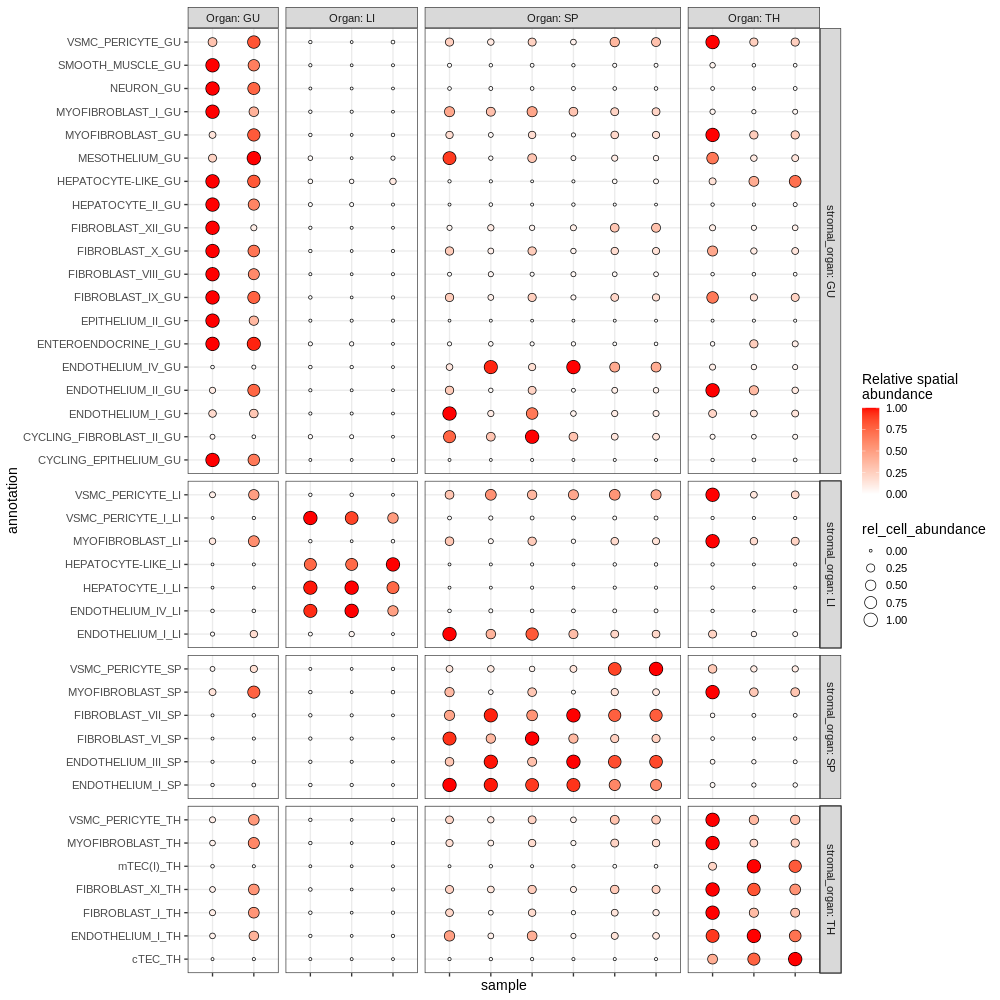

In [557]:
%%R -h 1000 -w 1000
pl_df %>%
    group_by(annotation) %>%
    filter(max(rel_cell_abundance) > 0.005) %>%
    ungroup() %>%
    group_by(annotation, stromal_organ) %>%
    mutate(rel_cell_abundance = (rel_cell_abundance - min(rel_cell_abundance))/(max(rel_cell_abundance) - min(rel_cell_abundance)))  %>%
 ggplot(aes(sample,annotation, fill=rel_cell_abundance)) +
    geom_point(shape=21, aes(size=rel_cell_abundance)) + 
#     geom_tile() +
    facet_grid(stromal_organ~Organ, scales='free', labeller='label_both', space="free") +
    scale_fill_gradient2(high="red", name='Relative spatial\nabundance',
                         limits=c(0, 1), breaks=seq(0, 1, by=0.25)) +
#     scale_fill_viridis_c(option='magma', name='Relative spatial\nabundance') +
#     scale_size(name='Relative spatial\nabundance',
#                          limits=c(0, 1), breaks=seq(0, 1, by=0.25)) +
#     guides(fill= guide_legend(), size=guide_legend()) +
    theme_bw(base_size = 14) +
    theme(axis.text.x = element_blank()) 
#     ggsave(paste0(figdir, 'stromal_cell_abundance_by_organ.pdf'), width=10, height=8)

`summarise()` has grouped output by 'sample', 'Organ'. You can override using the `.groups` argument.


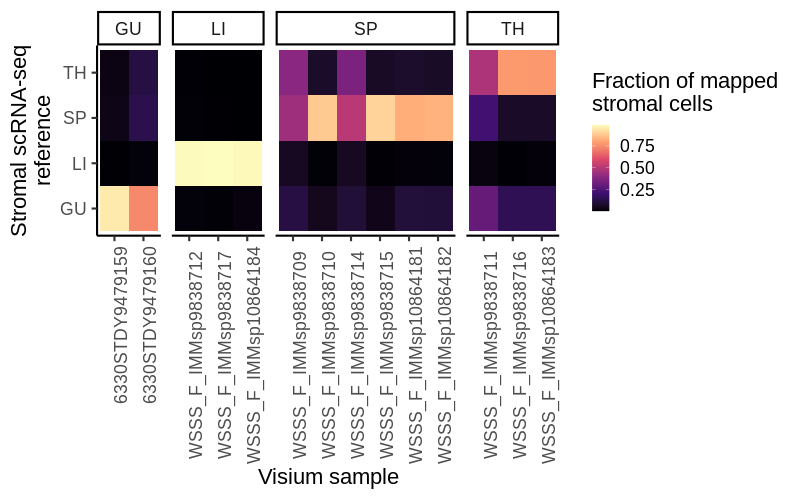

In [351]:
%%R -w 800 -h 500
pl_df %>%
    group_by(sample, Organ, stromal_organ) %>%
    summarise(rel_cell_abundance = sum(rel_cell_abundance)) %>%
    ggplot(aes(sample, stromal_organ)) +
    geom_tile(aes(fill=rel_cell_abundance)) +
    scale_fill_viridis_c(option="magma", name="Fraction of mapped\nstromal cells") +
    facet_grid(.~Organ, scales='free', space="free")+
    xlab("Visium sample") + ylab("Stromal scRNA-seq\nreference") +
    theme_classic(base_size = 22) +
    theme(axis.text.x = element_text(angle=90)) +
    ggsave(paste0(figdir, 'stromal_cell_mapping.pdf'), width=9, height=6)


## Colocation from cell abundance NMF on multi-organ reference

In [562]:
c2l_outdir = multiorgan_c2l_outdir 

In [563]:
nmf_fractions = read_nmf(c2l_outdir, n_fact=12)

In [564]:
n_fact_range = range(10,16)
max_cors = []
for n in n_fact_range:
    nmf_fractions = read_nmf(c2l_outdir, n_fact=n)
    fact_cors = np.corrcoef(nmf_fractions.T)
    np.fill_diagonal(fact_cors, 0)
    max_cor = abs(fact_cors).max()
    max_cors.append(max_cor)

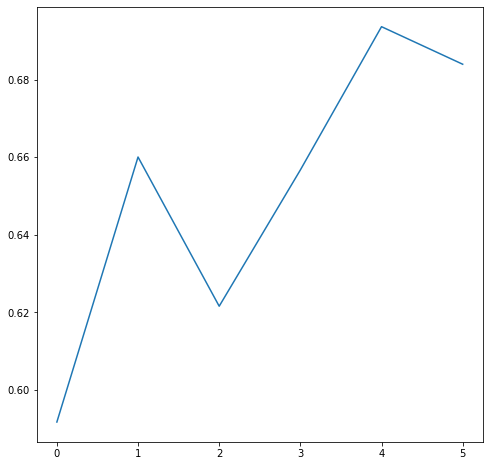

In [565]:
plt.plot(max_cors)

In [566]:
## Read cell type fractions
n = pick_n_factors(multiorgan_c2l_outdir, n_fact_range=n_fact_range)
nmf_fractions = read_nmf(multiorgan_c2l_outdir, n_fact=n)

## Read fraction values to locations
nmf_mat = read_nmf(multiorgan_c2l_outdir, n_fact=n, out_type='location')
adata_vis_full.obsm["NMF"] = nmf_mat.loc[adata_vis_full.obs_names]

In [567]:
## Assign each factor to one organ 
# (where max value of factor, empirically most factors can be connected to one organ)
all_f_df = pd.DataFrame()
all_org_mean_fact = pd.DataFrame()
for factor in ["fact_" + str(x) for x in range(0,n)]:
    adata_vis_full.obs[factor] = adata_vis_full.obsm["NMF"].loc[:,'mean_nUMI_factors' + factor]
    fact_df = adata_vis_full.obs[['sample', factor]]
#     fact_df[factor] = fact_df[factor].mask(fact_df[factor] < min_frac, 0)
    org_mean_fact = fact_df.groupby('sample').max()
    all_org_mean_fact = pd.concat([all_org_mean_fact, org_mean_fact], 1)
    f_df = pd.DataFrame([factor, org_mean_fact.idxmax().values[0], org_mean_fact.max().values[0]]).T
    all_f_df = pd.concat([all_f_df, f_df])

all_f_df.columns = ["factor", "top_organ", "top_organ_mean_nUMI"]

In [568]:
all_org_mean_fact.index = all_org_mean_fact.index.astype("str") + "_" + vis_sample_metadata_full.loc[all_org_mean_fact.index]['Organ']

In [658]:
%%R -i nmf_fractions -w 1000 -h 3500 -i figdir
library(patchwork)

plot_factor_id <- function(f, min_frac= 0.1, n_top=NULL, basesize=16,
                           highlight_cts = NULL
                          ){
    highlight_color = 'red'
    nmf_frac_df <- nmf_fractions %>%
        rownames_to_column('celltype') %>%
         pivot_longer(cols=-celltype, names_to="factor") %>%
        mutate(factor=str_remove(factor, 'mean_cell_type_factors')) 
    nmf_frac_df <- nmf_frac_df %>%
     filter(factor==paste0('fact_',f)) %>%
        filter(value > min_frac) %>%
        arrange(value) %>%
        mutate(celltype=factor(celltype, levels=celltype))
    
    if (!is.null(n_top)){
        nmf_frac_df <- nmf_frac_df %>%
        top_n(n_top, value)
    }
    
    if (!is.null(highlight_cts)){
       nmf_frac_df <- nmf_frac_df %>%
        mutate(ct_highlight=celltype %in% highlight_cts)
        label_colors <- ifelse(nmf_frac_df$celltype %in% highlight_cts, highlight_color,'black')
        label_facefont <- ifelse(nmf_frac_df$celltype %in% highlight_cts, 'bold','plain')
    }
    
    
    pl <- nmf_frac_df %>%
        ggplot(aes(value, celltype)) +
        geom_point(size=5) +
        geom_col(color='black', width=0.01) +
        theme_bw(base_size=basesize) +
        xlab("celltype fraction") +
        ggtitle(paste0("Factor", f))
    
    if (!is.null(highlight_cts)){
       pl <- pl +
        geom_point(data=. %>% filter(ct_highlight), size=6, color=highlight_color) +
        geom_col(data=. %>% filter(ct_highlight), color=highlight_color, width=0.02) +
        theme(axis.text.y = element_text(colour = label_colors, face=label_facefont))
    }
    
    return(pl)
    }

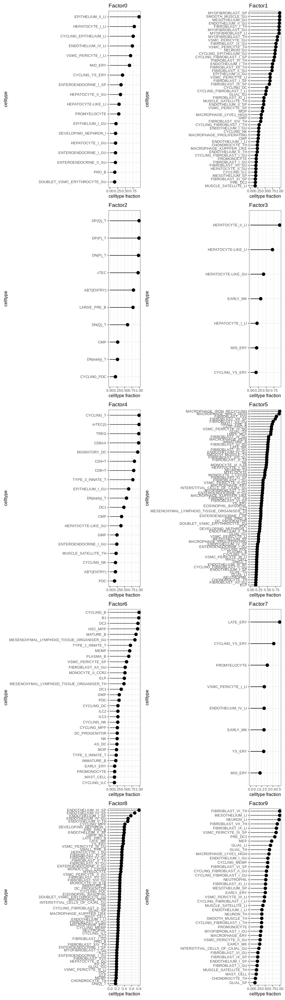

In [629]:
%%R -i nmf_fractions -w 1000 -h 3500 -i figdir
pl_ls <- lapply(0:9, function(i) plot_factor_id(i, min_frac=0.15))
wrap_plots(pl_ls, ncol=2) +
ggsave(paste0(figdir, "multiorgan_factors_n_fact10_factorIDs.pdf"), height=30, width=15)

In [41]:
coloc_df = get_colocation_from_nmf(adata_vis_full, vis_sample_metadata_full, multiorgan_c2l_outdir, n_factors=n, min_frac = 0.15, detection_thresh=0.15)

In [42]:
coloc_df

,fact_0,fact_1,fact_2,fact_3,fact_4,fact_5,fact_6,fact_7,fact_8,fact_9
ABT(ENTRY),0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
B1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
CD4+T,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
CD8+T,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
CD8AA,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
VSMC_PERICYTE_SP,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
VSMC_PERICYTE_TH,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
YS_ERY,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
cTEC,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [43]:
coloc_df.to_csv('/nfs/team205/ed6/data/Fetal_immune/tmp/c2l_multiorgan_colocation.v3.csv')

<AxesSubplot:>

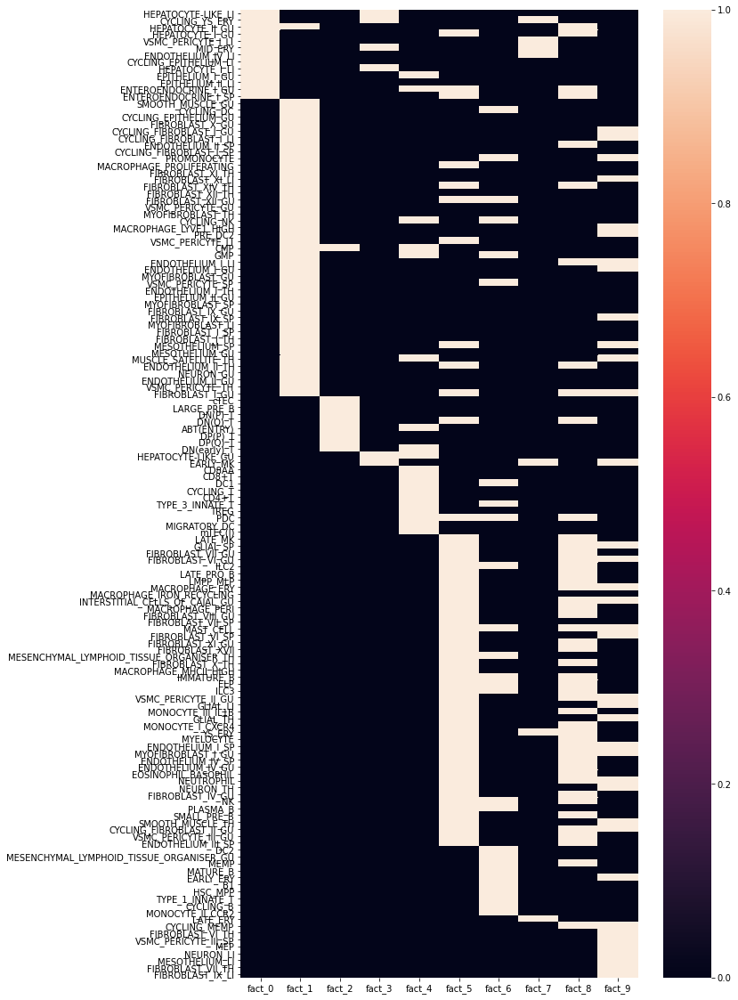

In [45]:
plt.rcParams['figure.figsize'] = 10,20
col_order = coloc_df.idxmax(1).sort_values().index
coloc_df = coloc_df.loc[col_order]
sns.heatmap(coloc_df, yticklabels=True)

### Plot B cell progenitor factor

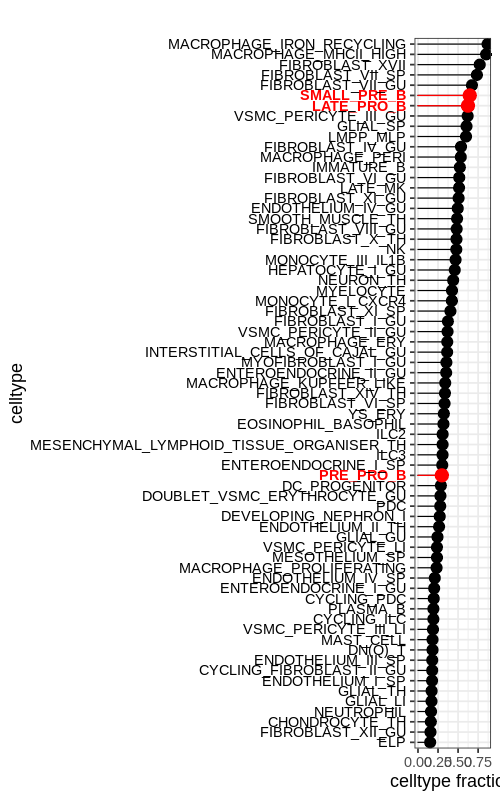

In [797]:
%%R -h 800 -w 500
plot_factor_id(5, min_frac=0.15,  basesize=18, highlight_cts=c("SMALL_PRE_B", "LATE_PRO_B", "PRO_B", "LARGE_PRE_B", "PRE_PRO_B")) +
ggtitle("") +
ggsave(paste0(figdir, "multiorgan_factor_5_Bprog.pdf"), height=13, width=8)

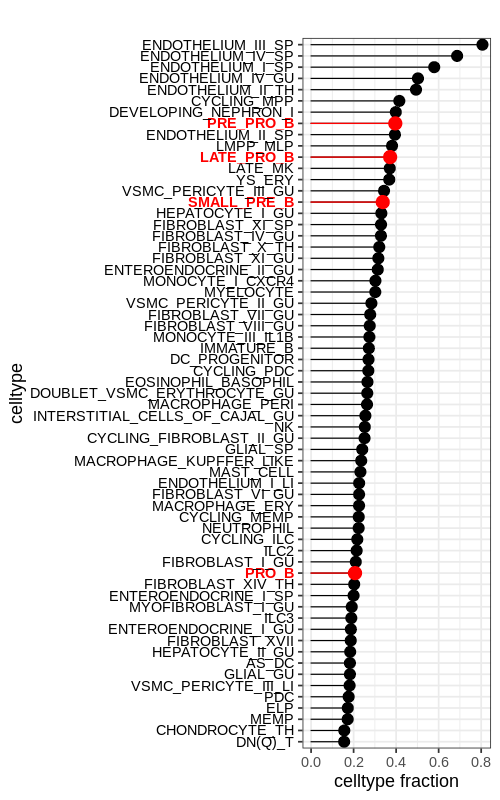

In [796]:
%%R -h 800 -w 500
plot_factor_id(8, min_frac=0.15, basesize=18, highlight_cts=c("SMALL_PRE_B", "LATE_PRO_B", "PRO_B", "LARGE_PRE_B", "PRE_PRO_B")) +
ggtitle("") +
ggsave(paste0(figdir, "multiorgan_factor_8_Bprog.pdf"), height=12, width=6.5)

### Aggregate progenitors by lineage

In [745]:
detection_thresh = 0.15
for lineage in progenitor_groups:
    lineage_abundance = adata_vis_full.obs[progenitor_groups[lineage]].sum(1)
    lineage_abundance[lineage_abundance < detection_thresh] = 0
    adata_vis_full.obs[lineage] = lineage_abundance

## Set lineage abundance to 0 in slide 
# if less than 1% of spots are below the detection thresh
for lineage in progenitor_groups:
    for s in adata_vis_full.obs["sample"].unique():
        sample_adata = adata_vis_full[adata_vis_full.obs['sample'] == s]
        frac_located = sum(sample_adata.obs[lineage]!=0)/sample_adata.n_obs
        if frac_located < 0.01:
            adata_vis_full.obs.loc[sample_adata.obs_names,lineage] = 0

In [799]:
adata_vis_full.obs['B_prog_relative'] = adata_vis_full.obs['B_prog']/adata_vis_full.obs['total_cell_abundance']

... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical


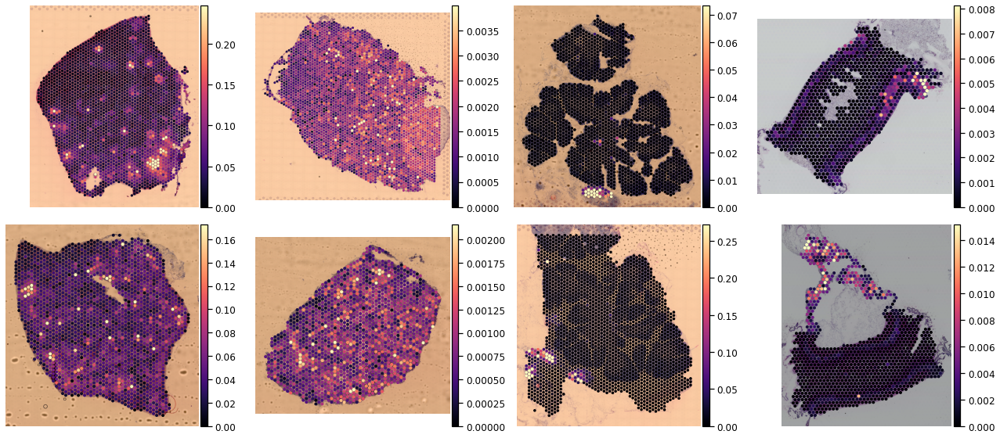

In [804]:
fig = _plot_slides_spatial(adata_vis_full, col_name='MESENCHYMAL_LYMPHOID_TISSUE_ORGANISER_TH', vmin=0)

... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical


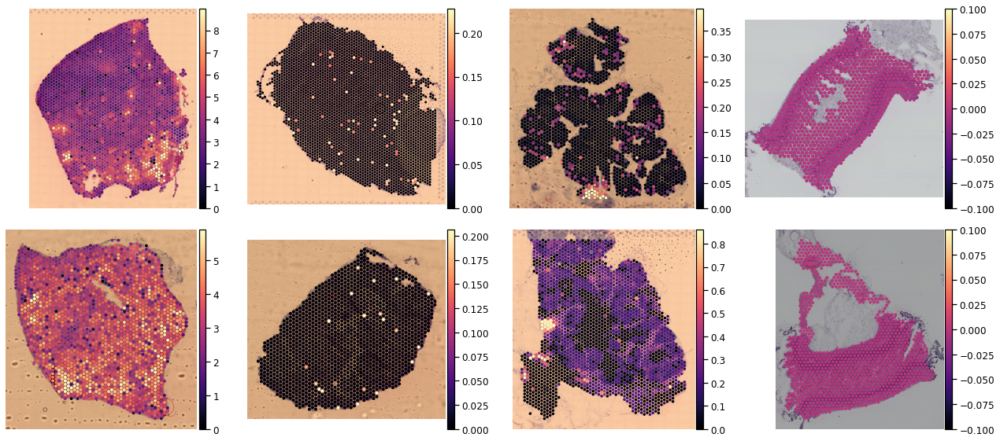

In [746]:
fig = _plot_slides_spatial(adata_vis_full, col_name='B_prog', vmin=0)
fig.savefig(figdir + 'Bprogenitors_spatial.pdf')

... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical


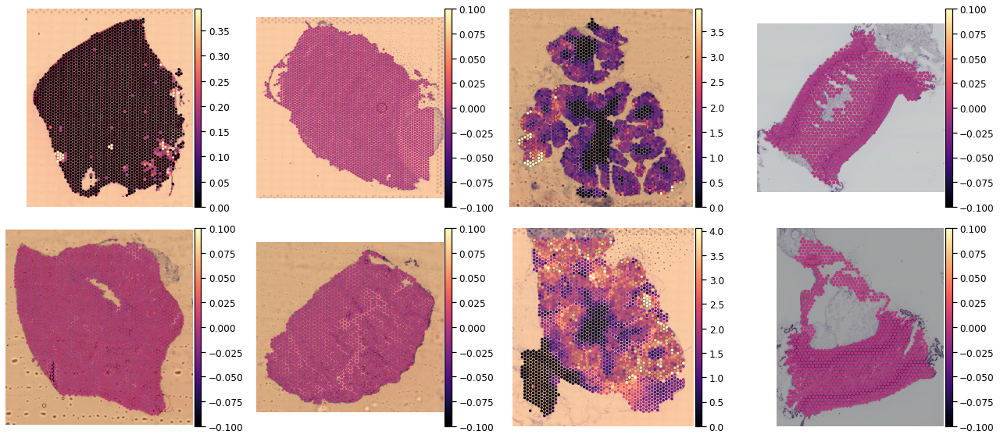

In [747]:
fig = _plot_slides_spatial(adata_vis_full, col_name='T_prog')
fig.savefig(figdir + 'Tprogenitors_spatial.pdf')

... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical


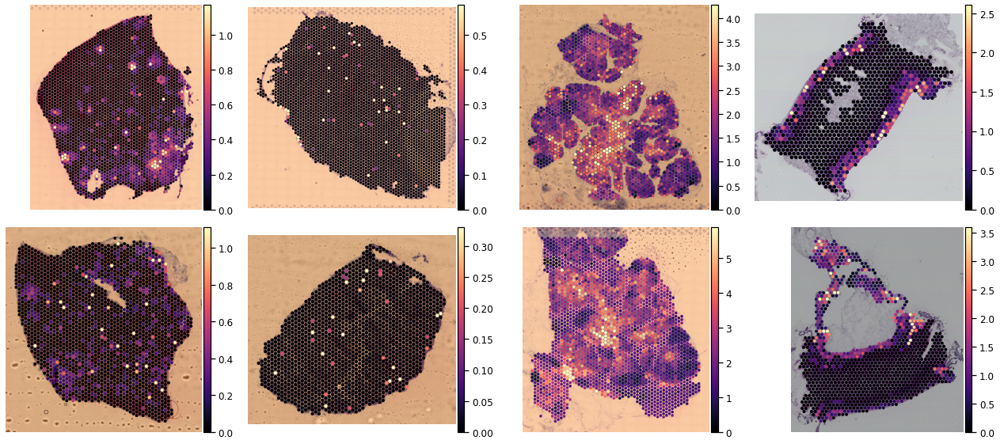

In [748]:
fig = _plot_slides_spatial(adata_vis_full, col_name='MYE_prog')
fig.savefig(figdir + 'MYEprogenitors_spatial.pdf')

In [610]:
vis_sample_metadata_full

,Organ,Age_PCW
sample,,
WSSS_F_IMMsp9838712,LI,18
WSSS_F_IMMsp9838709,SP,11
WSSS_F_IMMsp9838710,SP,18
WSSS_F_IMMsp9838711,TH,18
WSSS_F_IMMsp9838717,LI,18
WSSS_F_IMMsp9838714,SP,11
WSSS_F_IMMsp9838715,SP,18
WSSS_F_IMMsp9838716,TH,18
WSSS_F_IMMsp10864184,LI,18


... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical


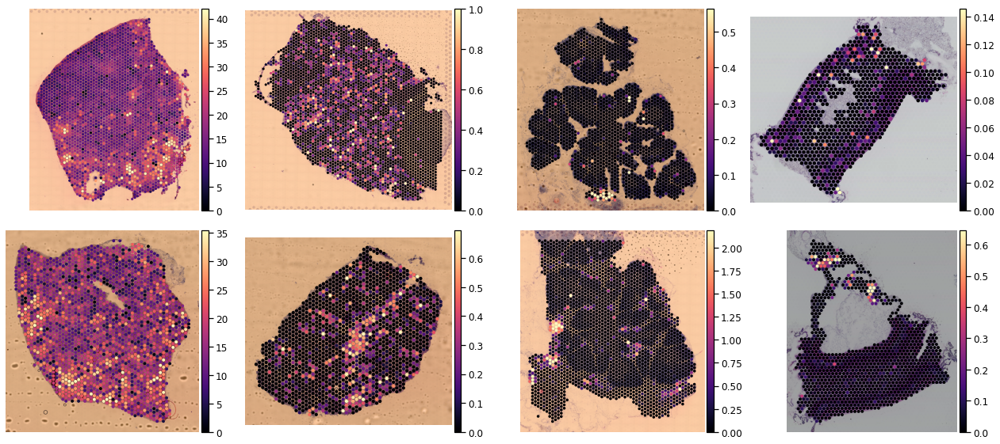

In [790]:
fig = _plot_slides_spatial(adata_vis_full, col_name='fact_8')
fig.savefig(figdir + 'multiorgan_Factor_8_spatial.pdf')

... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical
... storing 'Organ' as categorical


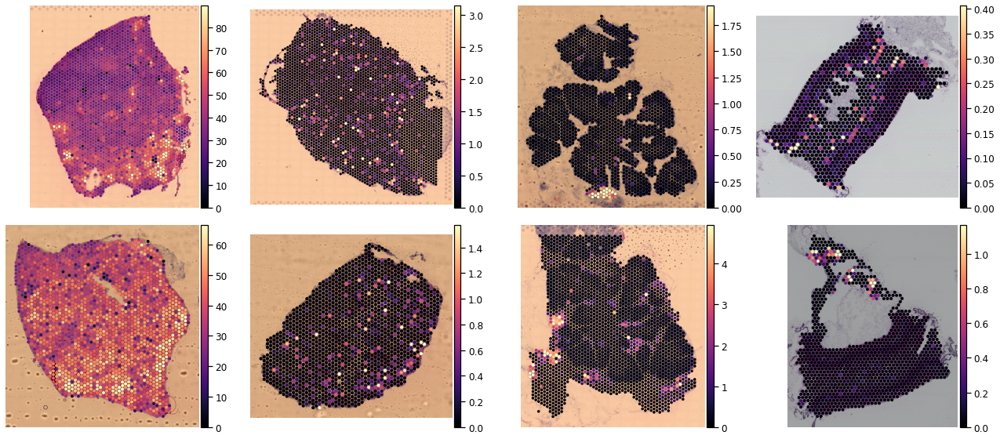

In [791]:
fig = _plot_slides_spatial(adata_vis_full, col_name='fact_5')
fig.savefig(figdir + 'multiorgan_Factor_5_spatial.pdf')

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/seaborn/matrix.py:659: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


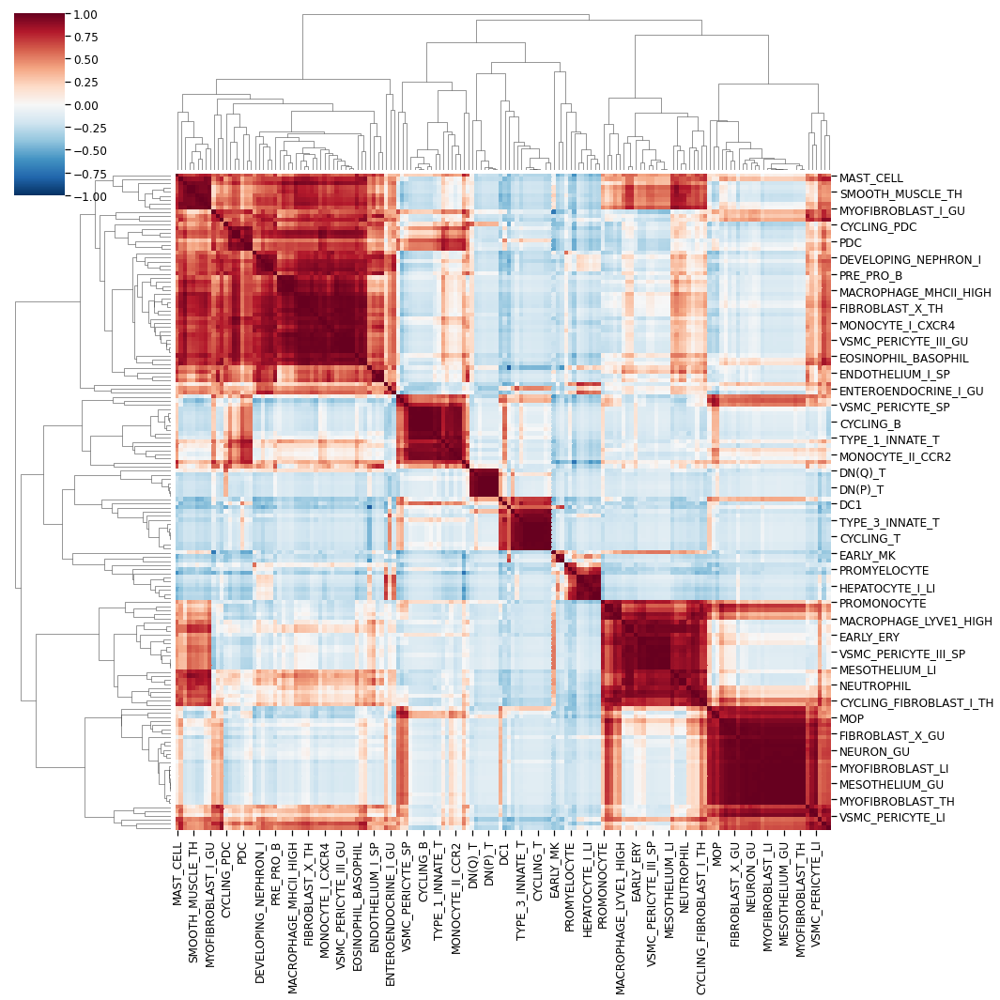

In [789]:
cormat = pd.DataFrame(np.corrcoef(nmf_fractions), columns=nmf_fractions.index, index=nmf_fractions.index)
sns.clustermap(cormat, cmap="RdBu_r", vmin=-1, vmax=1, figsize=[15,15])

In [779]:
def plot_nmf_fractions_ct(pl_df, org_fs, outfile, hm_height=10, hm_width=12):
    r_fct_str = '''
    library(tidyverse)
    plot_nmf_fractions <- function(pl_df, org_fs, outfile, save=TRUE, pl_height=10, pl_width=12){
        p1 <- pl_df %>%
            rownames_to_column("cell_type") %>%
            pivot_longer(cols=- cell_type, names_to="factor", values_to="ct_fraction") %>%
            mutate(factor=str_remove(factor, "mean_cell_type_factors")) %>%
            group_by(cell_type) %>%
            mutate(top_fact = which.max(ct_fraction)) %>%
            ungroup() %>%
            arrange(top_fact) %>%
            mutate(cell_type=factor(cell_type, levels=unique(cell_type))) %>%
            filter(factor %in% org_fs) %>%
            mutate(factor = factor(str_replace(factor, "fact_", "Factor "), levels=str_replace(org_fs, "fact_", "Factor "))) %>%
            ggplot(aes(factor, cell_type, color=ct_fraction, size=ct_fraction)) +
            geom_point() +
            scale_color_viridis_c(option='magma', direction=-1, name="cell type\nfraction", guide = "legend") +
            scale_size(name="cell type\nfraction") +
            ylab("cell type") +
            theme_bw(base_size=14) +
            theme(axis.text.x=element_text(angle=45, hjust=1, vjust=1)
                 )
        if (isTRUE(save)){
            print(paste0('saving to ', outfile))
            ggsave(paste0(outfile, '.pdf'), p1, height=pl_height, width=pl_width)
            ggsave(paste0(outfile, '.png'), p1, height=pl_height, width=pl_width)
          } else {
           print("not saving")
          p1   
        }
    }
    '''

    import rpy2.robjects.pandas2ri
    import rpy2.robjects.numpy2ri
    from rpy2.robjects.packages import STAP

    r_pkg = STAP(r_fct_str, "r_pkg")
    # PASS OBJECTS INTO FUNCTION
    r_pkg.plot_nmf_fractions(pl_df, org_fs, outfile, pl_height = hm_height, pl_width = hm_width)

def get_nmf_frac_4_plotting(nmf_fractions, org, org_fs, min_prop=0.25):
    all_orgs = ["SP", "LI", "TH"]
    ## Filter cell types by minimum proportion assigned to fraction
    filt_nmf_fractions = nmf_fractions[nmf_fractions[['mean_cell_type_factors' + x for x in org_fs]].max(1) > min_prop]
    pl_df = filt_nmf_fractions[['mean_cell_type_factors' + x for x in org_fs]]

    ## Exclude low Q annotations
    pl_df = pl_df[~pl_df.index.isin(anno_groups_dict["OTHER"])]

    ## Exclude stromal cells from other organs
    all_orgs.remove(org)
    end1, end2 = ("_" + x for x in all_orgs)
    remove_stromal = [x for x in pl_df.index if x.endswith(end1) or x.endswith(end2)]
    pl_df = pl_df[~pl_df.index.isin(remove_stromal)]
    return(pl_df)

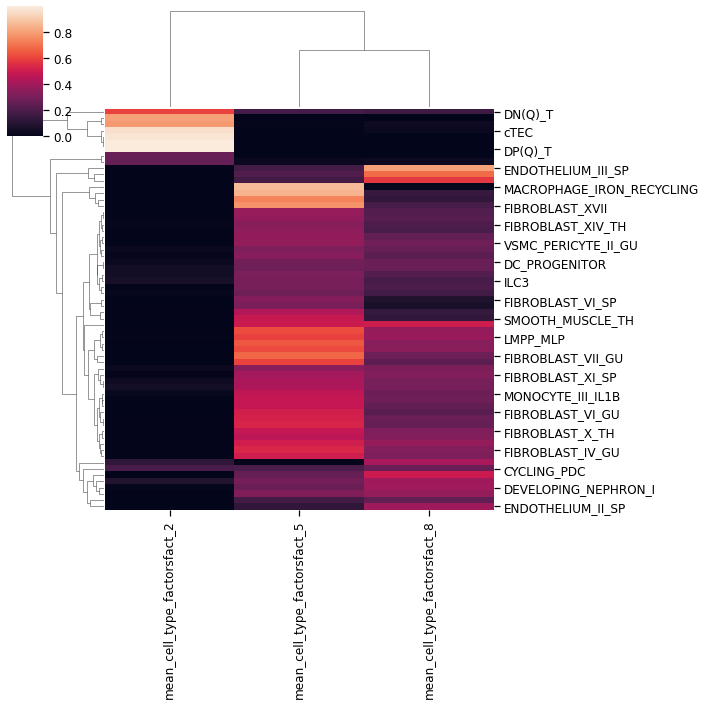

In [787]:
keep_factors = nmf_fractions.columns[nmf_fractions.loc[progenitor_groups['B_prog']].max() > 0.25]
keep_cts = nmf_fractions[keep_factors].max(1) > 0.25

sns.clustermap(nmf_fractions.loc[keep_cts, keep_factors])

In [788]:
plot_nmf_fractions_ct(nmf_fractions.loc[keep_cts, keep_factors], org_fs=['fact_'+x for x in ['5','8', '0', '2']], outfile=figdir+'Bprogenitors_factor_heatmap.pdf')

[1] "saving to /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/spatial_mapping_EDA/Bprogenitors_factor_heatmap.pdf"


In [809]:
sc_ct_counts[(sc_ct_counts.organ=='LI')].sort_values('n_cells')[0:50]

,organ,anno_lvl_2_final_clean,n_cells,anno_organ
149,LI,DN(P)_T,0,DN(P)_T_LI
147,LI,DEVELOPING_NEPHRON_I,0,DEVELOPING_NEPHRON_I_LI
148,LI,DEVELOPING_NEPHRON_II,0,DEVELOPING_NEPHRON_II_LI
172,LI,FIBROBLAST_I,0,FIBROBLAST_I_LI
150,LI,DN(Q)_T,0,DN(Q)_T_LI
179,LI,FIBROBLAST_XI,0,FIBROBLAST_XI_LI
178,LI,FIBROBLAST_X,0,FIBROBLAST_X_LI
177,LI,FIBROBLAST_VIII,0,FIBROBLAST_VIII_LI
176,LI,FIBROBLAST_VII,0,FIBROBLAST_VII_LI
217,LI,MESENCHYMAL_LYMPHOID_TISSUE_ORGANISER,0,MESENCHYMAL_LYMPHOID_TISSUE_ORGANISER_LI
